# How to work with journeys
[Link to tutorial](https://www.jupedsim.org/stable/notebooks/journey.html)

In [3]:
import inspect
import pathlib
import jupedsim as jps
import matplotlib.pyplot as plt
import numpy as np
import pedpy
from matplotlib.patches import Circle
from shapely import Polygon
%matplotlib inline
from jupedsim.internal.notebook_utils import  read_sqlite_file
from typing import Tuple
import numpy.typing as npt
from scipy import stats
from plotly.subplots import make_subplots
import math
import plotly.graph_objects as go
import warnings

from Py.animation import animate

%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Preparing the Simulation: Geometry and Routing Instructions

In [4]:
simulation_polygon = Polygon(
    [(-7, 15), (-7, -7), (23, -7), (23, 0), (0, 0), (0, 15)]
)
exit_polygon = [(-6.8, 14.8), (-0.2, 14.8), (-0.2, 13.5), (-6.8, 13.5)]
switch_point = (7, -3.5)
waypoints = [
    (-0.5, -0.5),
    (-3, -2),
    (-6, -4),
]
distance_to_waypoints = 3
distance_to_switch = 3

distribution_polygon = Polygon(
    [[22.8, -0.3], [10.8, -0.3], [10.8, -6.8], [22.8, -6.8]]
)
walkable_area = pedpy.WalkableArea(simulation_polygon)

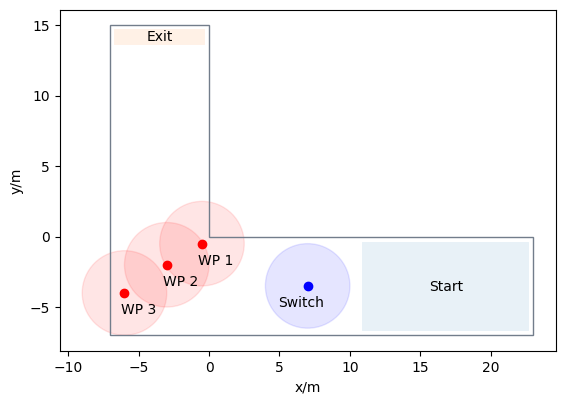

In [5]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_aspect("equal")
pedpy.plot_walkable_area(walkable_area=walkable_area, axes=ax)

# Drawing the distribution polygon
x, y = distribution_polygon.exterior.xy
plt.fill(x, y, alpha=0.1)
plt.plot(x, y, color="white")
centroid = distribution_polygon.centroid
plt.text(centroid.x, centroid.y, "Start", ha="center", va="center", fontsize=10)

# Drawing the exit polygon
x, y = Polygon(exit_polygon).exterior.xy
plt.fill(x, y, alpha=0.1)
plt.plot(x, y, color="white")
centroid = Polygon(exit_polygon).centroid
plt.text(centroid.x, centroid.y, "Exit", ha="center", va="center", fontsize=10)

# Drawing the swithch circle
ax.plot(switch_point[0], switch_point[1], "bo") # "bo" -> b(blue) o(circle)
circle = Circle(
    (switch_point[0], switch_point[1]),
    distance_to_switch,
    fc="blue",
    ec="blue",
    alpha=0.1,
)
ax.add_patch(circle)
ax.annotate(
    "Switch",
    (switch_point[0], switch_point[1]),
    textcoords="offset points",
    xytext=(-5, -15),
    ha="center",
)

# Drawing the waypoints
for idx, waypoint in enumerate(waypoints):
    ax.plot(waypoint[0], waypoint[1], "ro") # "ro" -> r(red) o(circle)
    ax.annotate(
        f"WP {idx+1}",
        (waypoint[0], waypoint[1]),
        textcoords="offset points",
        xytext=(10, -15),
        ha="center",
    )
    circle = Circle(
        (waypoint[0], waypoint[1]),
        distance_to_waypoints,
        fc="red",
        ec="red",
        alpha=0.1,
    )
    ax.add_patch(circle)

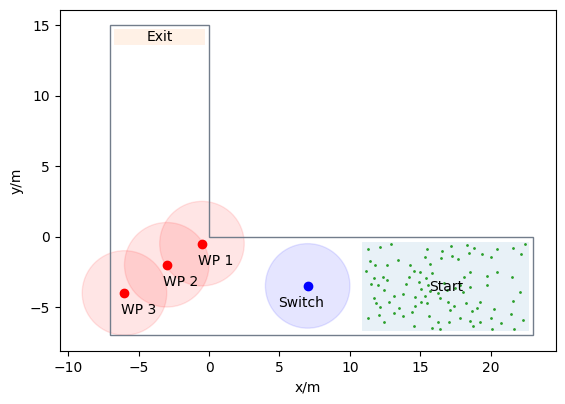

In [6]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_aspect("equal")
pedpy.plot_walkable_area(walkable_area=walkable_area, axes=ax)

# Drawing the distribution polygon
x, y = distribution_polygon.exterior.xy
plt.fill(x, y, alpha=0.1)
plt.plot(x, y, color="white")
centroid = distribution_polygon.centroid
plt.text(centroid.x, centroid.y, "Start", ha="center", va="center", fontsize=10)

# Drawing the exit polygon
x, y = Polygon(exit_polygon).exterior.xy
plt.fill(x, y, alpha=0.1)
plt.plot(x, y, color="white")
centroid = Polygon(exit_polygon).centroid
plt.text(centroid.x, centroid.y, "Exit", ha="center", va="center", fontsize=10)

# Drawing the swithch circle
ax.plot(switch_point[0], switch_point[1], "bo") # "bo" -> b(blue) o(circle)
circle = Circle(
    (switch_point[0], switch_point[1]),
    distance_to_switch,
    fc="blue",
    ec="blue",
    alpha=0.1,
)
ax.add_patch(circle)
ax.annotate(
    "Switch",
    (switch_point[0], switch_point[1]),
    textcoords="offset points",
    xytext=(-5, -15),
    ha="center",
)

# Drawing the waypoints
for idx, waypoint in enumerate(waypoints):
    ax.plot(waypoint[0], waypoint[1], "ro") # "ro" -> r(red) o(circle)
    ax.annotate(
        f"WP {idx+1}",
        (waypoint[0], waypoint[1]),
        textcoords="offset points",
        xytext=(10, -15),
        ha="center",
    )
    circle = Circle(
        (waypoint[0], waypoint[1]),
        distance_to_waypoints,
        fc="red",
        ec="red",
        alpha=0.1,
    )
    ax.add_patch(circle)
num_agents = 100
positions = jps.distribute_by_number(
    polygon=distribution_polygon,
    number_of_agents=num_agents,
    distance_to_agents=0.4,
    seed=12,
    distance_to_polygon=0.2,
)
ax.scatter(*zip(*positions), s=1)

plt.show()

### Direct Path Strategy

## Exploring Transition Strategies

In [7]:
def shortest_path(simulation: jps.Simulation, switch_id, waypoint_ids, exit_id):
    """Build a journey with fixed transitions for a given simulation."""

    journey = jps.JourneyDescription([switch_id, *waypoint_ids, exit_id]) # we add all posible points
    # switch ---> 1st waypoint
    journey.set_transition_for_stage(
        switch_id, jps.Transition.create_fixed_transition(waypoint_ids[0])
    )
    # 1st waypoint ---> exit
    journey.set_transition_for_stage(
        waypoint_ids[0], jps.Transition.create_fixed_transition(exit_id)
    )

    journey_id = simulation.add_journey(journey)
    return journey_id

### Balanced Load Strategy

In [8]:
def least_targeted(simulation: jps.Simulation, switch_id, waypoint_ids, exit_id):
    """Build a journey with least targeted transitions for a given simulation."""

    journey = jps.JourneyDescription([switch_id, *waypoint_ids, exit_id])
    # switch ---> least targeted waypoint
    journey.set_transition_for_stage(
        switch_id,
        jps.Transition.create_least_targeted_transition(waypoint_ids)
    )
    # from all waypoints ---> exit    !Important! from all waypoints
    for waypoint_id in waypoint_ids:
        journey.set_transition_for_stage(
            waypoint_id, jps.Transition.create_fixed_transition(exit_id)
        )

    journey_id = simulation.add_journey(journey)
    return journey_id

### Round Robin Strategy

In [9]:
def round_robin(simulation: jps.Simulation, switch_id, waypoint_ids, exit_id):
    """Build a journey with least round-robin transitions for a given simulation."""

    journey = jps.JourneyDescription([switch_id, *waypoint_ids, exit_id])
    # switch ---> 1st waypoint with weight1
    # switch ---> 2nd waypoint with weight2
    # switch ---> 3th waypoint with weight3
    weight1, weight2, weight3 = 1, 1, 1
    journey.set_transition_for_stage(
        switch_id,
        jps.Transition.create_round_robin_transition(
            [
                (waypoint_ids[0], weight1),
                (waypoint_ids[1], weight2),
                (waypoint_ids[2], weight3),
            ]
        ),
    )
    # from all waypoints ---> exit
    for waypoint_id in waypoint_ids:
        journey.set_transition_for_stage(
            waypoint_id, jps.Transition.create_fixed_transition(exit_id)
        )

    journey_id = simulation.add_journey(journey)
    return journey_id

### Scenarios

In [10]:
scenarios = [
    shortest_path,
    least_targeted,
    round_robin,
]

## Executing the Simulation

In [11]:
def run_scenario_simulation(scenario, agent_parameters, positions, geometry):
    """Runs a simulation for a given scenario using the provided simulation object, agent parameters, and positions."""
    filename = f"../../sqlite_data/{scenario.__name__}.sqlite"

    simulation = jps.Simulation(
        dt=0.05,
        model=jps.CollisionFreeSpeedModel(
            strength_neighbor_repulsion=2.6,
            range_neighbor_repulsion=0.1,
            range_geometry_repulsion=0.05,
        ),
        geometry=geometry,
        trajectory_writer=jps.SqliteTrajectoryWriter(
            output_file=pathlib.Path(filename)
        ),
    )
    exit_id = simulation.add_exit_stage(exit_polygon)
    switch_id = simulation.add_waypoint_stage(switch_point, distance_to_switch)
    waypoint_ids = [
        simulation.add_waypoint_stage(waypoint, distance_to_waypoints)
        for waypoint in waypoints
    ]
    agent_parameters.stage_id = switch_id
    journey_id = scenario(simulation, switch_id, waypoint_ids, exit_id)
    agent_parameters.journey_id = journey_id
    for new_pos in positions:
        agent_parameters.position = new_pos
        simulation.add_agent(agent_parameters)

    while simulation.agent_count() > 0:
        simulation.iterate()

    return filename, simulation.iteration_count()

In [12]:
for scenario in scenarios:
    filename, iteration_count = run_scenario_simulation(
        scenario,
        jps.CollisionFreeSpeedModelAgentParameters(),
        positions,
        walkable_area.polygon,
    )

## Visualizing the Trajectories

In [26]:
agent_trajectories = {}
for scenario in scenarios:
    scenario_name = scenario.__name__
    agent_trajectories[scenario_name], walkable_area = read_sqlite_file(
        f"../../sqlite_data/{scenario_name}.sqlite"
    )
    animate(
        agent_trajectories[scenario_name],
        walkable_area,
        title_note=f"Scenario: {scenario_name}",
        every_nth_frame=10,
        waypoint_coords=waypoints,
        specific_area=distribution_polygon
    ).show()

## Analysis of the results

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
for name, ax in zip(agent_trajectories, axes):
    pedpy.plot_trajectories(
        traj=agent_trajectories[name],
        walkable_area=walkable_area,
        axes=ax,
        traj_width=0.2,
        traj_color="blue",
    )
    x, y = Polygon(exit_polygon).exterior.xy
    ax.fill(x, y, alpha=0.1, color="red")
    ax.plot(x, y, color="white")
    centroid = Polygon(exit_polygon).centroid
    ax.text(
        centroid.x, centroid.y, "Exit", ha="center", va="center", fontsize=10
    )
    ax.set_title(name)

## Calculate Profiles

In [ ]:

def calculate_density_average_classic(
    bounds: Tuple[float, float, float, float],
    dx: float,
    nframes: int,
    X: npt.NDArray[np.float64],
    Y: npt.NDArray[np.float64],
) -> npt.NDArray[np.float64]:
    """Calculate classical method

    Density = mean_time(N/A_i)
    """
    geominX, geominY, geomaxX, geomaxY = bounds
    xbins = np.arange(geominX, geomaxX + dx, dx)
    ybins = np.arange(geominY, geomaxY + dx, dx)
    area = dx * dx
    ret = stats.binned_statistic_2d(
        X,
        Y,
        None,
        "count",
        bins=[xbins, ybins],
    )
    return np.array(np.nan_to_num(ret.statistic.T)) / nframes / area

In [ ]:
def plot_classical_density_profile(data, walkable_area, name, dx, rho_max):
    geominX, geominY, geomaxX, geomaxY = walkable_area.bounds
    title = f"<b>{name}</b>"
    fig = make_subplots(rows=1, cols=1, subplot_titles=([title]))
    xbins = np.arange(geominX, geomaxX + dx, dx)
    ybins = np.arange(geominY, geomaxY + dx, dx)
    x, y = walkable_area.polygon.exterior.xy
    x = list(x)
    y = list(y)
    heatmap = go.Heatmap(
        x=xbins,
        y=ybins,
        z=data,
        zmin=0,
        zmax=rho_max,
        name=title,
        connectgaps=False,
        zsmooth=None,
        hovertemplate="Density: %{z:.2f}<br>\nPos: (%{x:2f}: %{y:.2f}}",
        colorbar=dict(title="Density"),
        colorscale="Jet",
    )
    fig.add_trace(heatmap)
    #    Geometry walls
    line = go.Scatter(
        x=x,
        y=y,
        mode="lines",
        name="wall",
        showlegend=False,
        line=dict(
            width=3,
            color="white",
        ),
    )
    fig.add_trace(line)

    return fig

In [ ]:
dx = 0.5
rho_max = -1
fig = make_subplots(
    rows=1, cols=3, subplot_titles=(list(agent_trajectories.keys()))
)
for count, name in enumerate(agent_trajectories):
    trajectories = agent_trajectories[name]
    data = calculate_density_average_classic(
        walkable_area.bounds,
        dx,
        nframes=trajectories.data["frame"].max(),
        X=trajectories.data["x"],
        Y=trajectories.data["y"],
    )
    rho_max = max(np.max(data), rho_max)
    ind_fig = plot_classical_density_profile(
        data, walkable_area, name, dx, math.ceil(rho_max)
    )
    for trace in ind_fig.data:
        fig.add_trace(trace, row=1, col=count + 1)

    fig.update_xaxes(title_text="X [m]", row=1, col=count + 1)
    fig.update_yaxes(title_text="Y [m]", scaleanchor="x", scaleratio=1, title_standoff=0)
fig

## Analyzing Evacuation Duration

In [ ]:
measurement_line = pedpy.MeasurementLine([[-6.8, 10], [-0.2, 10]])
pedpy.plot_measurement_setup(
    walkable_area=walkable_area,
    measurement_lines=[measurement_line],
    ml_color="red",
    ml_width=2,
).set_aspect("equal")
plt.show()

In [ ]:
warnings.filterwarnings("ignore")
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 10))
colors = ["blue", "red", "green"]
for i, name in enumerate(agent_trajectories):
    nt, _ = pedpy.compute_n_t(
        traj_data=agent_trajectories[name],
        measurement_line=measurement_line,
    )
    ax = pedpy.plot_nt(nt=nt, color=colors[i])
    ax.lines[-1].set_label(name)
    Time = np.max(nt["time"]) # max time for this scenario
    print(
        "Name: {:<20} Evacuation time: {:<15}".format(
            name, "{} seconds".format(Time)
        )
    )
ax.legend()
plt.show()